<a href="https://colab.research.google.com/github/pscabral/IFMASOFTEX_1/blob/main/FruitsResNet50%20.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install gdown
import gdown

# Especifique o ID do arquivo e o nome do arquivo de saída
file_id = '1aX48j7lKyE0c66tMZEesOwNncFbyvu6X'
output = 'dataset.zip'

# Baixe o arquivo do Google Drive
gdown.download(f'https://drive.google.com/uc?id={file_id}', output, quiet=False)

!unzip dataset.zip

In [5]:
import os

def remove_folder_contents(folder):
    for the_file in os.listdir(folder):
        file_path = os.path.join(folder, the_file)
        try:
            if os.path.isfile(file_path):
                os.unlink(file_path)
            elif os.path.isdir(file_path):
                remove_folder_contents(file_path)
                os.rmdir(file_path)
        except Exception as e:
            print(e)

folder_path = '/content/dataset_3'
#remove_folder_contents(folder_path)

In [6]:
!pip install Augmentor

In [7]:
import Augmentor
import cv2
import numpy as np
import pandas as pd
import time
import matplotlib.pyplot as plt
import random
import seaborn as sns

from pathlib import Path
from PIL import Image

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline

import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.metrics import CategoricalAccuracy
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [16]:
train_dir = Path('/content/dataset_3/train')

In [17]:
def create_df(path):
    # creating a list of paths to all the files with the .jpg extension.
    filepaths = list(path.glob(r'**/*.jpg'))

    # creating a list of paths to all the files with the .jpg extension.
    labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

    # creating a DataFrame from the lists of filepaths and labels.
    filepaths = pd.Series(filepaths, name='Filepath').astype(str)
    labels = pd.Series(labels, name='Label')

    df = pd.concat([filepaths, labels], axis=1)

    return df

train = create_df(train_dir)
print('Train shape is ' , train.shape)


Train shape is  (2780, 2)


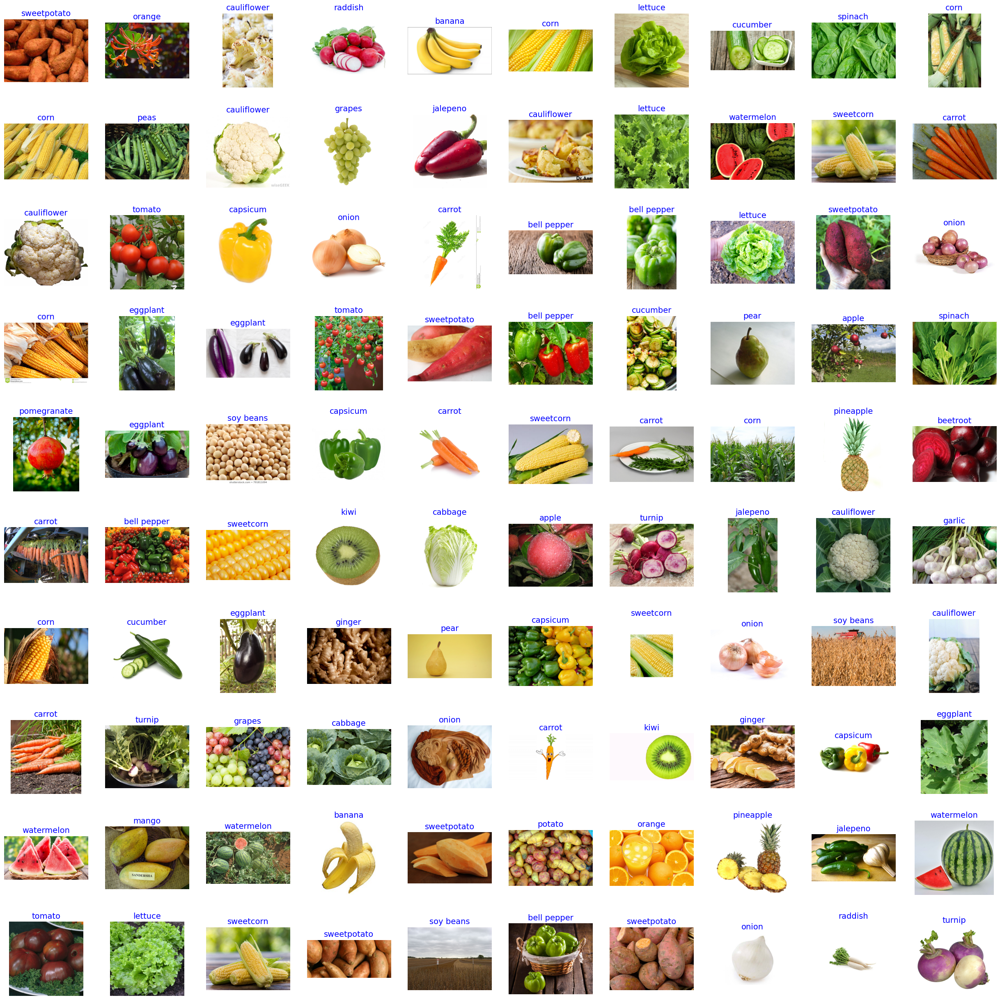

In [18]:
random_img = train.sample(100).reset_index()
fig, axes = plt.subplots(nrows=10, ncols=10, figsize=(25, 25),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(random_img.Filepath[i]))
    ax.set_title(random_img.Label[i], color='blue', fontsize=14)
    ax.axis('off')
plt.tight_layout(pad=3.0)
plt.show()

In [19]:
train, test = train_test_split(train, test_size=0.2, random_state=42)
test_df, val_df = train_test_split(test, test_size=0.5, random_state=42)
print('Train shape is ' , train.shape)
print('Validation shape is ' ,val_df.shape)
print('Test shape is ' , test_df.shape)

Train shape is  (2224, 2)
Validation shape is  (278, 2)
Test shape is  (278, 2)


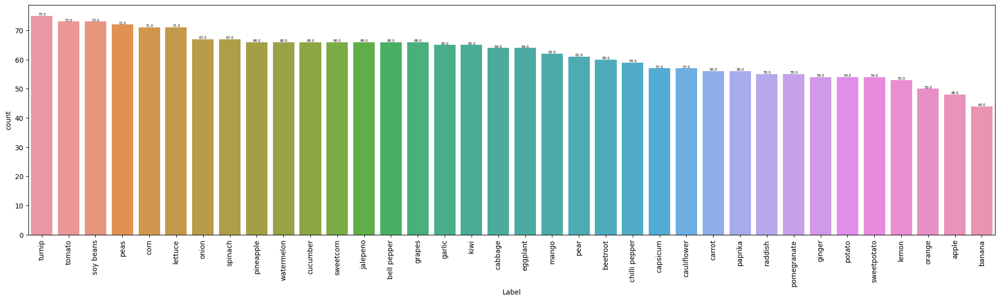

In [20]:
train_count = train['Label'].value_counts()
train_order = list(train_count.index)

plt.figure(figsize=(25,6))

ax = sns.countplot(x='Label', data=train, order=train_order)

for p in ax.patches:
    height = p.get_height()
    ax.annotate(f"{height}", (p.get_x() + p.get_width() / 2., height), ha='center', va='bottom', fontsize=5)
    ax.set_xticklabels(train_count.index, rotation=90)

plt.show;

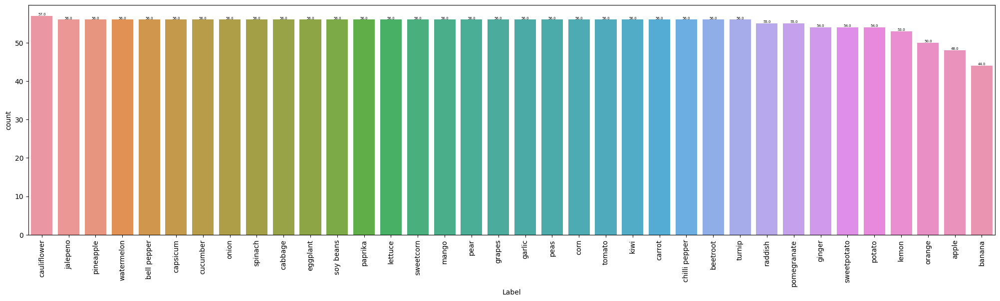

In [21]:
def indices(category):
    indices = train.index[train['Label'] == category]
    random_indices = random.sample(list(indices), train_count[category] - train_count[25])
    return random_indices


for category in train_count[:24].index:
    idx = indices(category)
    train = train.drop(idx)

train_count = train['Label'].value_counts()
train_order = list(train_count.index)

plt.figure(figsize=(25,6))

ax = sns.countplot(x='Label', data=train, order=train_order)

for p in ax.patches:
    height = p.get_height()
    ax.annotate(f"{height}", (p.get_x() + p.get_width() / 2., height), ha='center', va='bottom', fontsize=5)
    ax.set_xticklabels(train_count.index, rotation=90)

plt.show;

In [22]:
input_directory = str(train_dir) + '/'
output_directory = '/content/dataset_3'

def augmentation(category, n):
    p = Augmentor.Pipeline(input_directory + category,
                          output_directory + category)
    p.rotate90(probability=0.5)
    p.rotate270(probability=0.5)
    p.flip_left_right(probability=0.8)
    p.flip_top_bottom(probability=0.3)
    p.sample(n)


for category in train_count[-5:].index:
    n = int(train_count[-6] - train_count[category])
    augmentation(category, n)


Initialised with 77 image(s) found.
Output directory set to /content/dataset_3potato.

Processing <PIL.Image.Image image mode=RGB size=1200x809 at 0x7F1D4EA70D00>: 100%|██████████| 77/77 [00:00<00:00, 79.07 Samples/s]


Initialised with 82 image(s) found.
Output directory set to /content/dataset_3lemon.

Processing <PIL.Image.Image image mode=RGB size=667x1000 at 0x7F1D4EA71900>: 100%|██████████| 1/1 [00:00<00:00, 23.70 Samples/s]


Initialised with 69 image(s) found.
Output directory set to /content/dataset_3orange.

Processing <PIL.Image.Image image mode=RGB size=1024x1024 at 0x7F1D51262AD0>: 100%|██████████| 4/4 [00:00<00:00, 79.97 Samples/s]


Initialised with 68 image(s) found.
Output directory set to /content/dataset_3apple.

Processing <PIL.Image.Image image mode=RGB size=1920x1080 at 0x7F1D4EA719C0>: 100%|██████████| 6/6 [00:00<00:00,  8.87 Samples/s]


Initialised with 75 image(s) found.
Output directory set to /content/dataset_3banana.

Processing <PIL.Image.Image image mode=RGB size=1067x1600 at 0x7F1D4EA732B0>: 100%|██████████| 10/10 [00:00<00:00, 23.59 Samples/s]


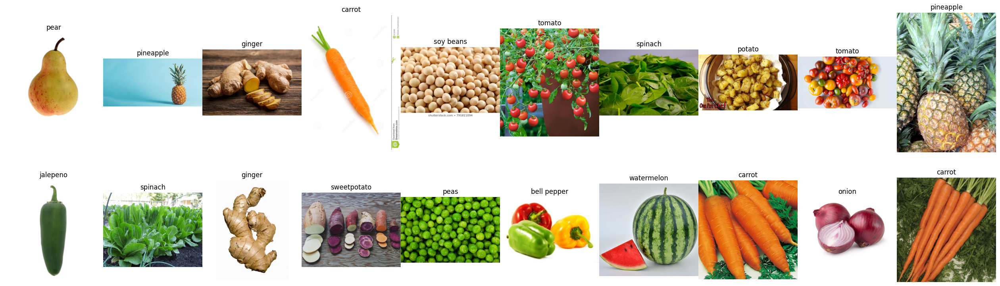

In [23]:
# creating dataframe from augmentation images
aug_dir = Path(output_directory)
aug_df = create_df(aug_dir)

# Display some pictures of the augmentation dataset
random_img = aug_df.sample(20).reset_index()
fig, axes = plt.subplots(nrows=2, ncols=10, figsize=(25, 8),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(random_img.Filepath[i]))
    ax.set_title(random_img.Label[i], fontsize = 12)
    ax.axis('off')
plt.tight_layout(pad=0.0)
plt.show()


In [34]:
train_df = pd.concat([train, aug_df], axis=0)
train_df.reset_index(drop=True, inplace=True)
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5428 entries, 0 to 5427
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Filepath  5428 non-null   object
 1   Label     5428 non-null   object
dtypes: object(2)
memory usage: 84.9+ KB


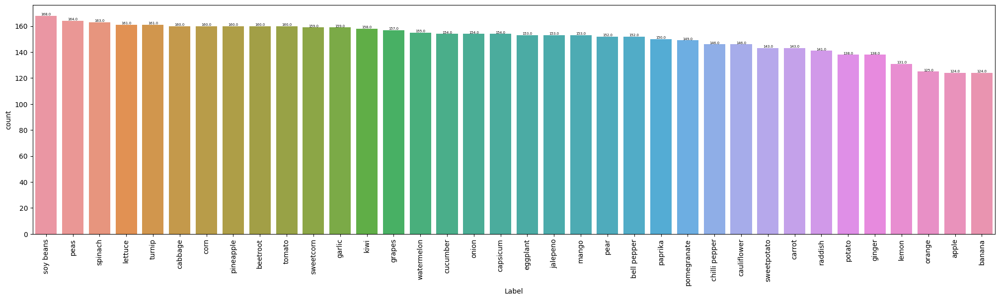

In [35]:
train_count = train_df['Label'].value_counts()
train_order = list(train_count.index)

plt.figure(figsize=(25,6))

ax = sns.countplot(x='Label', data=train_df, order=train_order)

for p in ax.patches:
    height = p.get_height()
    ax.annotate(f"{height}", (p.get_x() + p.get_width() / 2., height), ha='center', va='bottom', fontsize=5)
    ax.set_xticklabels(train_count.index, rotation=90)

plt.show;

In [41]:
def prepare_data(train):
    data = []
    labels = []
    for row in train.itertuples():
        img = cv2.imread(row.Filepath)

        if img is not None:
            img = cv2.resize(img, (15, 15))
            img = img.astype('float32') / 255.0
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            data.append(img.flatten())
            labels.append(row.Label)
        else:
            print(f"Error loading image: {row.Filepath}")

    data = np.asarray(data)
    labels = np.asarray(labels)

    return data, labels

x_train, y_train = prepare_data(train_df)
x_test, y_test = prepare_data(test)


Error loading image: /content/dataset_3/train/bell pepper/Image_56.jpg
Error loading image: /content/dataset_3/train/bell pepper/Image_56.jpg


In [42]:
# Encoding class labels
le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_test = le.fit_transform(y_test)
class_names = np.unique(le.inverse_transform(y_test))

In [43]:
clf = SGDClassifier(loss='log', penalty='l2')

start_time = time.time()

clf.fit(x_train, y_train)

end_time = time.time()

y_pred = clf.predict(x_test)

accuracy_train = clf.score(x_train, y_train)
accuracy_test = clf.score(x_test, y_test)

print('Execution time: {:.2f} seconds'.format(end_time - start_time))
print('Accuracy on train: {:.2f}%'.format(accuracy_train*100))
print('Accuracy on test: {:.2f}%'.format(accuracy_test*100))
print('\nClassification Report:\n\n',classification_report(y_test, y_pred, target_names=class_names))

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(


Execution time: 24.75 seconds
Accuracy on train: 80.61%
Accuracy on test: 68.53%

Classification Report:

                precision    recall  f1-score   support

        apple       0.62      0.50      0.56        10
       banana       0.89      0.44      0.59        18
     beetroot       0.72      0.96      0.82        24
  bell pepper       0.71      1.00      0.83        12
      cabbage       0.85      0.85      0.85        20
     capsicum       0.65      0.57      0.60        23
       carrot       1.00      0.76      0.87        17
  cauliflower       0.59      0.71      0.65        14
chilli pepper       0.76      0.76      0.76        17
         corn       0.65      0.85      0.73        13
     cucumber       1.00      0.58      0.74        12
     eggplant       0.69      0.85      0.76        13
       garlic       1.00      0.28      0.43        18
       ginger       1.00      0.60      0.75        10
       grapes       0.76      0.84      0.80        19
     jalepen

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


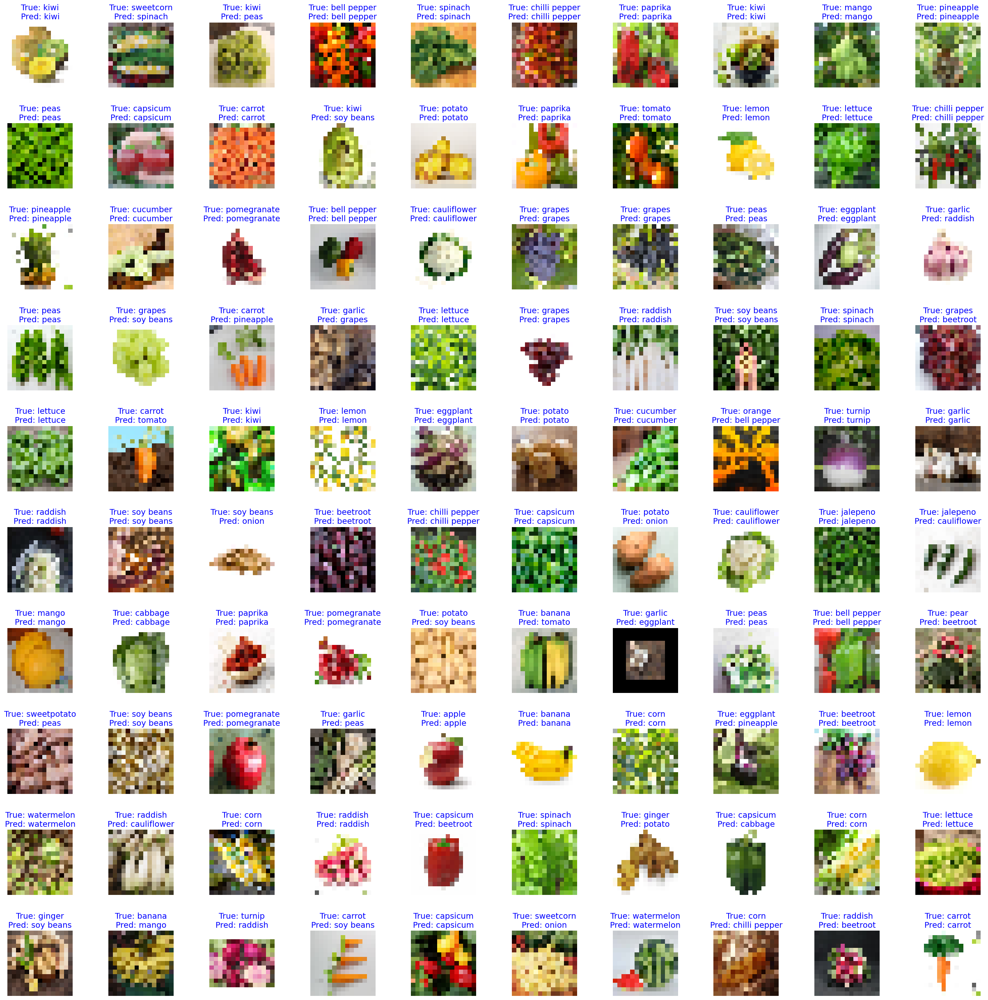

In [44]:
# selecting 100 random instances from x_test.
num_images = 100
random_indices = random.sample(range(len(x_test)), num_images)
sample_images = x_test[random_indices]
sample_labels = y_test[random_indices]

predictions = clf.predict(sample_images)

# Display images and their corresponding classes.
fig, axes = plt.subplots(nrows=10, ncols=10, figsize=(25, 25),
                         subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):

    img = sample_images[i].reshape((15, 15, 3))
    ax.imshow(img)

    true_label = class_names[sample_labels[i]]
    pred_label = class_names[predictions[i]]
    ax.set_title(f'True: {true_label}\nPred: {pred_label}', color='blue', fontsize=14)
    ax.axis('off')

plt.tight_layout(pad=3.0)
plt.show()

In [45]:
generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input
    )

def progress_image(df, shuffle):
    image = generator.flow_from_dataframe(
        dataframe=df,
        x_col='Filepath',
        y_col='Label',
        target_size=(100, 100),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=32,
        shuffle=shuffle,
    )
    return image


train_images = progress_image(train_df, True)
val_images = progress_image(val_df, False)
test_images = progress_image(test_df, False)

Found 5428 validated image filenames belonging to 36 classes.
Found 278 validated image filenames belonging to 36 classes.
Found 278 validated image filenames belonging to 36 classes.


In [ ]:
def create_model(pretrained_model):

        inputs = pretrained_model.input

        dense_1 = tf.keras.layers.Dense(512, activation='relu')(pretrained_model.output)
        dropout_1 = tf.keras.layers.Dropout(0.5)(dense_1)

        dense_2 = tf.keras.layers.Dense(128, activation='relu')(dropout_1)
        dropout_2 = tf.keras.layers.Dropout(0.5)(dense_2)

        outputs = tf.keras.layers.Dense(36, activation='softmax')(dropout_2)

        model = tf.keras.Model(inputs, outputs)

        model.compile(optimizer=Adam(lr=1e-5),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])

        return model

pretrained_model = tf.keras.applications.resnet50.ResNet50(input_shape=(100, 100, 3),
                                                                  include_top=False,
                                                                  weights='imagenet',
                                                                  pooling='avg'
                                                                 )

model = create_model(pretrained_model)
model.summary()

In [ ]:
history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=50,
    batch_size=32,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=10,
            restore_best_weights=True
        )
    ]
)

Epoch 1/50
170/170 [==============================] - 319s 2s/step - loss: 3.4377 - accuracy: 0.0984 - val_loss: 3.6317 - val_accuracy: 0.0612
Epoch 2/50
170/170 [==============================] - 297s 2s/step - loss: 2.7815 - accuracy: 0.2183 - val_loss: 2.8513 - val_accuracy: 0.2410
Epoch 3/50
170/170 [==============================] - 294s 2s/step - loss: 2.1849 - accuracy: 0.3648 - val_loss: 2.4123 - val_accuracy: 0.3381
Epoch 4/50
 21/170 [==>...........................] - ETA: 4:15 - loss: 1.7529 - accuracy: 0.4583